# DSBA6165 - Group Project
## Group 1 - Medical Image Classifiers

*   Anulitha Vardhan
*   Carsten Lingemann
*   Sundari Kala


# Imports and General Functions

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, datasets, Model, utils
print("TF version:", tf.__version__)

import matplotlib.pyplot as plt   
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.metrics import classification_report, confusion_matrix

import pathlib

%matplotlib inline

TF version: 2.12.0


In [2]:
tf.get_logger().setLevel('ERROR')

In [3]:
def show_image(x, title="", bot=""):
    plt.imshow(x)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.xlabel(bot)


In [4]:
def display_images(ds):
    class_names = ds.class_names
    plt.figure(figsize=(10, 10))
    for images, labels in ds.take(1):
      for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        show_image(images[i].numpy().astype("uint8"), class_names[labels[i]])
    plt.tight_layout()


In [5]:
def display_images_with_predictions(ds, pred_model):
    class_names = ds.class_names
    plt.figure(figsize=(10, 10))
    for images, labels in ds.take(1):
      predictions = pred_model.predict(images)
      predicted_classes = np.argmax(predictions, axis=1)
      for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        show_image(images[i].numpy().astype("uint8"), class_names[labels[i]], f'Predicted: {class_names[predicted_classes[i]]}')
    plt.tight_layout()


In [6]:
def display_augmented_images(ds):
    plt.figure(figsize=(10, 10))
    for images, _ in ds.take(1):
        
        plt.figure(figsize=(10,8))
        plt.subplot(3, 4, 5)
        plt.imshow(images[0].numpy().astype("uint8"))
        plt.axis("off")

        print(f"Shape of Batch: {images.shape}")   
        
        for i in range(9):
            augmented_images = data_augmentation(images)
            ax = plt.subplot(3, 4, int(i/3)*4 + 2 + (i % 3))
            plt.imshow(augmented_images[0].numpy().astype("uint8"))
            plt.axis("off")
        plt.tight_layout()


In [7]:
def plot_learning(history, model_name):
    tgts = ['loss','accuracy']
    i=0

    plt.figure(figsize=(10, 5))
    for tgt in tgts:
      ax = plt.subplot(1,2, i + 1)
      plt.plot(history.history[tgt], label=tgt)
      plt.plot(history.history['val_'+tgt], label='val_'+tgt)
      plt.xlabel('Epoch')
      plt.legend()
      plt.title(f"{model_name} - {tgt}")
      i +=1


In [8]:
def train_model(train_ds, valid_ds, model, cb_name, optimizer, loss, model_name, num_epochs=20):
    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    cb = keras.callbacks.ModelCheckpoint(cb_name, monitor='val_loss', save_best_only=True)
    history = model.fit(train_ds, epochs=num_epochs, validation_data=valid_ds, callbacks=cb)
    plot_learning(history, model_name)


In [9]:
def evaluate_model(cb_name, test_ds):
    test_model = keras.models.load_model(cb_name)
    print(test_model.evaluate(test_ds))
    display_images_with_predictions(test_ds, test_model)
    pred = test_model.predict(test_ds)


# Data


In [10]:
# global variables used for all datasets and models
IMG_SIZE = 224
BATCH_SIZE = 32


## Kaggle Setup

Please follow the steps below to be able to download the dataset from Kaggle:

1. Create a Kaggle account, if you do not already have one. 
2. Go to Account page, click on "Create New API Token" under API. This will create and download `kaggle.json`. 
2. Upload the `kaggle.json` file by running the cell below.

In [11]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"cjlingemann","key":"f12dd5de0aff8b724d1ff9c358d2b07f"}'}

In [12]:
# Setting up kaggle API
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

## Brain Tumor MRI Dataset

The [Brain Tumor MRI Dataset](https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset) contains brain tumor images under 4 categories:

*   Glioma Tumor
*   Meningioma Tumor
*   Pituitary Tumor
*   No Tumor

The Train and Test data is separated in different directories within the zip file:

*   Training: /training (contains ~5.7k images)
*   Testing: /testing (contains ~1.3k images)

As there is no validation folder, we will use an 80/20 split on the training folder for training and validation.

In [13]:
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset

 98% 146M/149M [00:00<00:00, 227MB/s]
100% 149M/149M [00:00<00:00, 217MB/s]


In [14]:
!unzip -q /content/brain-tumor-mri-dataset.zip -d /content/brain-tumor-mri-dataset

In [15]:
!ls -l /content/brain-tumor-mri-dataset/Training

total 208
drwxr-xr-x 2 root root 53248 May  4 21:45 glioma
drwxr-xr-x 2 root root 45056 May  4 21:45 meningioma
drwxr-xr-x 2 root root 61440 May  4 21:45 notumor
drwxr-xr-x 2 root root 53248 May  4 21:45 pituitary


In [16]:
!ls -l /content/brain-tumor-mri-dataset/Training/*/*.jpg | wc -l

5712


In [17]:
!ls -l /content/brain-tumor-mri-dataset/Testing/*/*.jpg | wc -l

1311


In [18]:
train_path = pathlib.Path('/content/brain-tumor-mri-dataset/Training')
test_path = pathlib.Path('/content/brain-tumor-mri-dataset/Testing')

bt_train_ds, bt_valid_ds = utils.image_dataset_from_directory(
    train_path,
    validation_split=0.2,
    subset="both",
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

bt_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )


Found 5712 files belonging to 4 classes.
Using 4570 files for training.
Using 1142 files for validation.
Found 1311 files belonging to 4 classes.


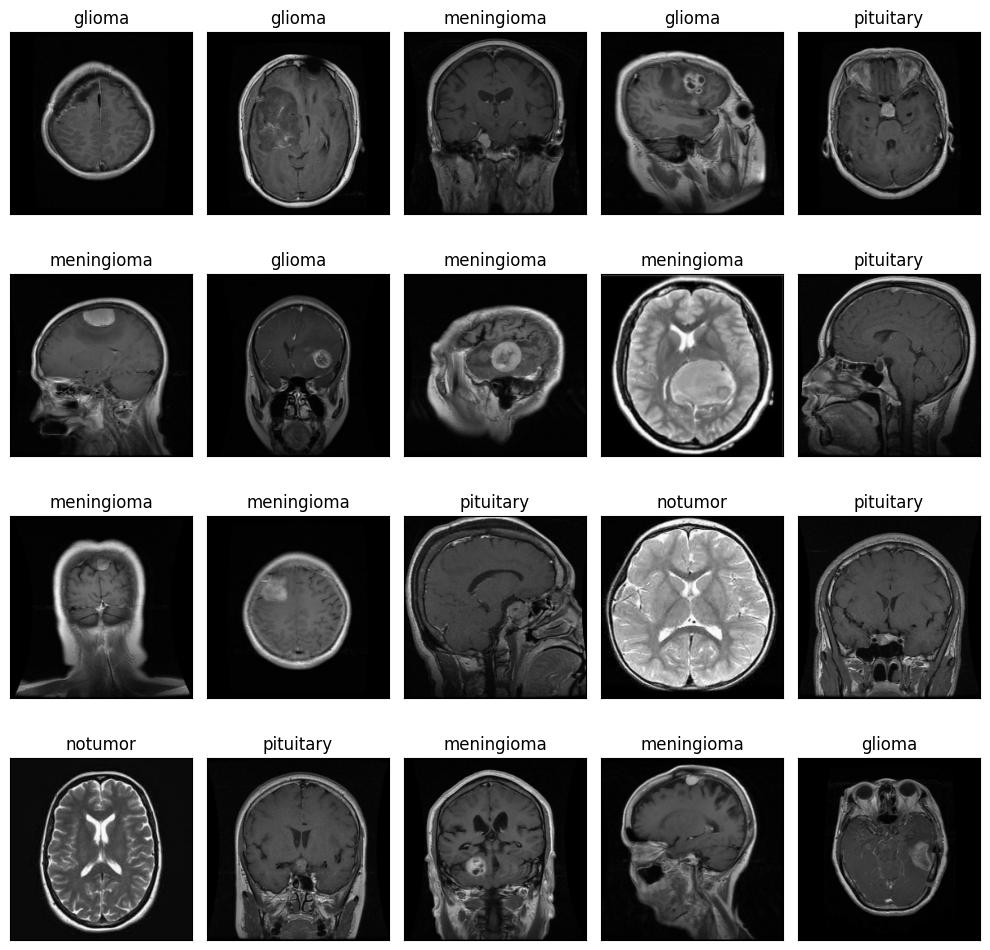

In [19]:
display_images(bt_train_ds)

## Leukemia Dataset

The [Leukemia Dataset](https://www.kaggle.com/datasets/abeerelmorshedy/leukemia) contains blood cell images under 2 categories:

*   all - Acute Lymphoblastic Leukemia
*   hem - Normal Blood Cell

The Train, Validation, and Test data is separated in different directories within the zip file:

*   Training: /training (contains ~6k images)
*   Validation: /validation (contains ~1.3k images)
*   Testing: /testing (contains ~1.3k images)


In [20]:
!kaggle datasets download -d abeerelmorshedy/leukemia

 97% 454M/466M [00:04<00:00, 151MB/s]
100% 466M/466M [00:04<00:00, 116MB/s]


In [21]:
!unzip -q /content/leukemia.zip -d /content/leukemia

In [22]:
!ls -l /content/leukemia/training

total 240
drwxr-xr-x 2 root root 143360 May  4 21:46 all
drwxr-xr-x 2 root root 102400 May  4 21:46 hem


In [23]:
!ls -l /content/leukemia/training/*/*.bmp | wc -l

6090


In [24]:
!ls -l /content/leukemia/validation/*/*.bmp | wc -l

1260


In [25]:
!ls -l /content/leukemia/testing/*/*.bmp | wc -l

1263


In [26]:
train_path = pathlib.Path('/content/leukemia/training')
valid_path = pathlib.Path('/content/leukemia/validation')
test_path = pathlib.Path('/content/leukemia/testing')

leu_train_ds = utils.image_dataset_from_directory(
    train_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

leu_valid_ds = utils.image_dataset_from_directory(
    valid_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

leu_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )


Found 6090 files belonging to 2 classes.
Found 1260 files belonging to 2 classes.
Found 1263 files belonging to 2 classes.


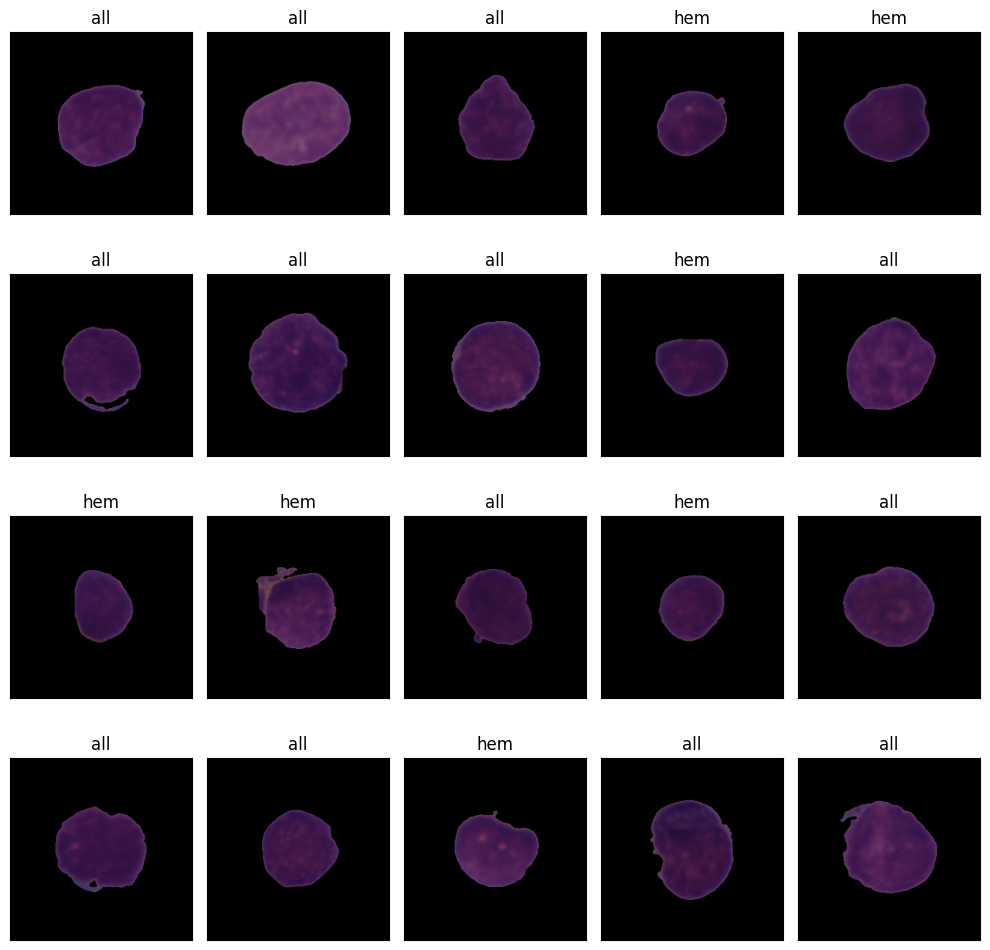

In [27]:
display_images(leu_train_ds)

## Chest X-Ray Dataset

The [Chest X-Ray](https://www.kaggle.com/datasets/artyomkolas/3-kinds-of-pneumonia) Dataset contains chest images under 4 categories:

*   COVID-19
*   Pnuemonia-Bacterial
*   Pnuemonia-Viral
*   Normal

The dataset contains a total of 9206 images, and is not split between training, validation or testing sets, so we will need to handle that as part of our preprocessing.

In [28]:
!kaggle datasets download -d artyomkolas/3-kinds-of-pneumonia

100% 3.48G/3.49G [00:26<00:00, 98.6MB/s]
100% 3.49G/3.49G [00:26<00:00, 140MB/s] 


In [29]:
!unzip -q /content/3-kinds-of-pneumonia.zip -d /content

In [30]:
!mv '/content/Curated X-Ray Dataset' /content/Curated_X-Ray_Dataset

In [31]:
!ls -l /content/Curated_X-Ray_Dataset

total 468
drwxr-xr-x 2 root root  57344 May  4 21:47 COVID-19
drwxr-xr-x 2 root root 135168 May  4 21:47 Normal
drwxr-xr-x 2 root root 180224 May  4 21:47 Pneumonia-Bacterial
drwxr-xr-x 2 root root  98304 May  4 21:47 Pneumonia-Viral


In [32]:
!pip install split-folders
import splitfolders
splitfolders.ratio('/content/Curated_X-Ray_Dataset', output='/content/Curated_X-Ray_Dataset/split', seed=42, ratio=(0.5, 0.2, 0.3))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 9208 files [00:21, 435.90 files/s]


In [33]:
!ls -l /content/Curated_X-Ray_Dataset/split/*

/content/Curated_X-Ray_Dataset/split/test:
total 156
drwxr-xr-x 2 root root 20480 May  4 21:47 COVID-19
drwxr-xr-x 2 root root 36864 May  4 21:48 Normal
drwxr-xr-x 2 root root 61440 May  4 21:48 Pneumonia-Bacterial
drwxr-xr-x 2 root root 36864 May  4 21:48 Pneumonia-Viral

/content/Curated_X-Ray_Dataset/split/train:
total 240
drwxr-xr-x 2 root root 36864 May  4 21:47 COVID-19
drwxr-xr-x 2 root root 69632 May  4 21:47 Normal
drwxr-xr-x 2 root root 94208 May  4 21:48 Pneumonia-Bacterial
drwxr-xr-x 2 root root 45056 May  4 21:48 Pneumonia-Viral

/content/Curated_X-Ray_Dataset/split/val:
total 112
drwxr-xr-x 2 root root 12288 May  4 21:47 COVID-19
drwxr-xr-x 2 root root 36864 May  4 21:48 Normal
drwxr-xr-x 2 root root 36864 May  4 21:48 Pneumonia-Bacterial
drwxr-xr-x 2 root root 20480 May  4 21:48 Pneumonia-Viral


In [34]:
!ls -l /content/Curated_X-Ray_Dataset/split/test/*/*.jpg | wc -l

2764


In [35]:
!ls -l /content/Curated_X-Ray_Dataset/split/train/*/*.jpg | wc -l

4603


In [36]:
!ls -l /content/Curated_X-Ray_Dataset/split/val/*/*.jpg | wc -l

1841


In [37]:
train_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/train')
val_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/val')
test_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/test')

xray_train_ds = utils.image_dataset_from_directory(
    train_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

xray_valid_ds = utils.image_dataset_from_directory(
    val_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

xray_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )


Found 4603 files belonging to 4 classes.
Found 1841 files belonging to 4 classes.
Found 2764 files belonging to 4 classes.


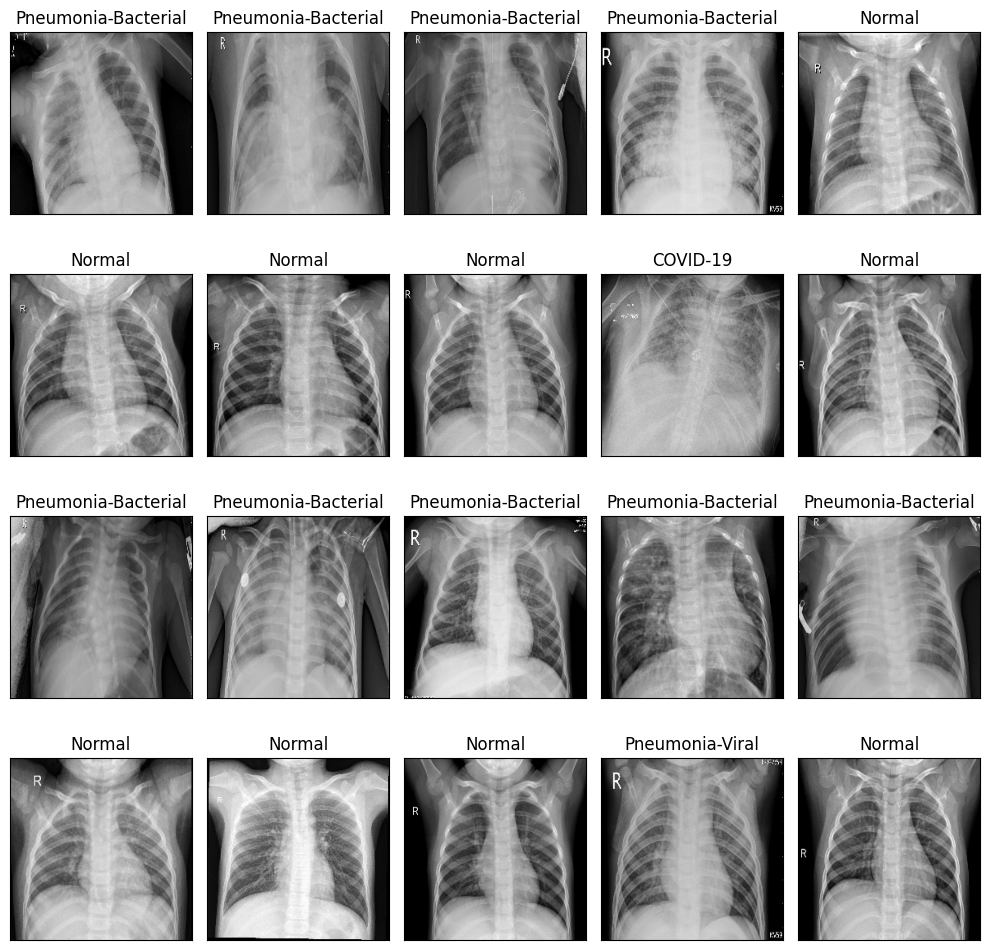

In [38]:
display_images(xray_train_ds)

# Image Augmentation

In [39]:
data_augmentation = keras.Sequential([
    layers.RandomZoom(0.3),
    layers.RandomFlip("horizontal"),
    layers.RandomWidth(0.2),
    layers.RandomHeight(0.2),
    layers.RandomFlip("vertical")
])

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

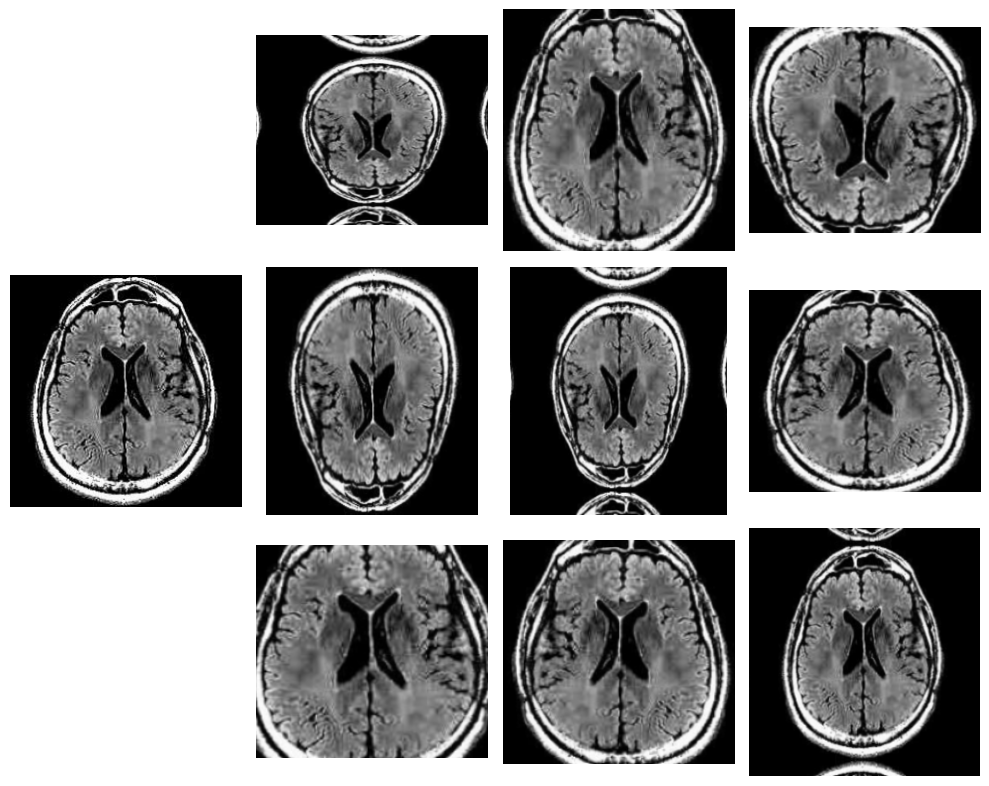

In [40]:
display_augmented_images(bt_train_ds)

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

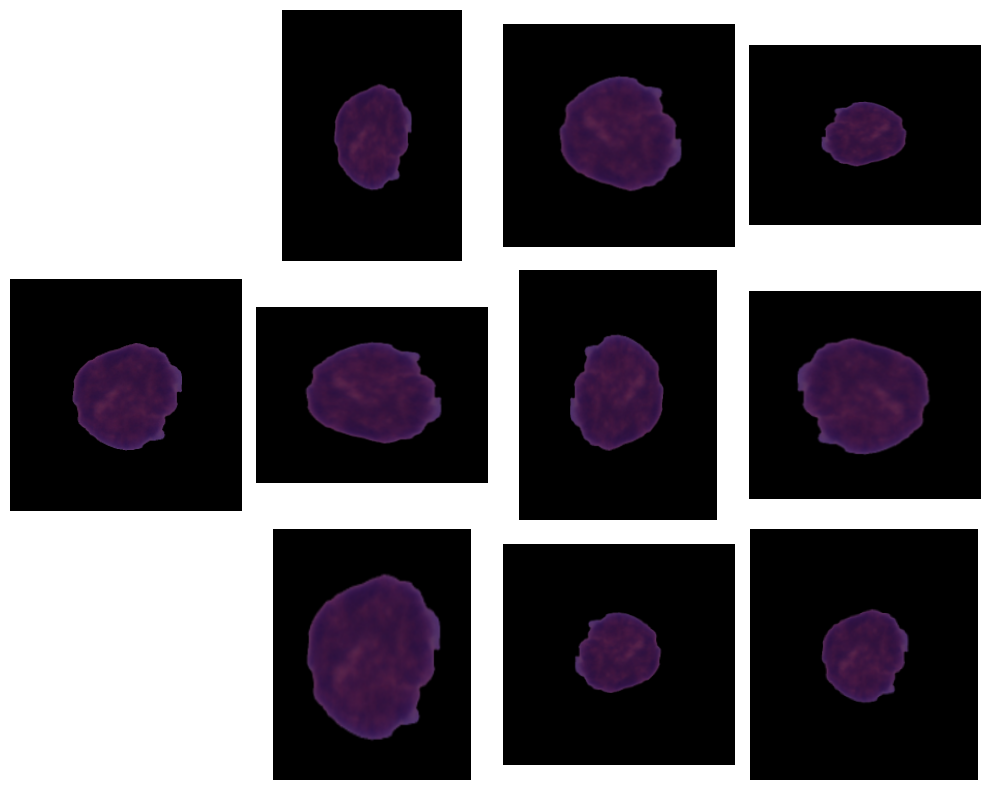

In [41]:
display_augmented_images(leu_train_ds)

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

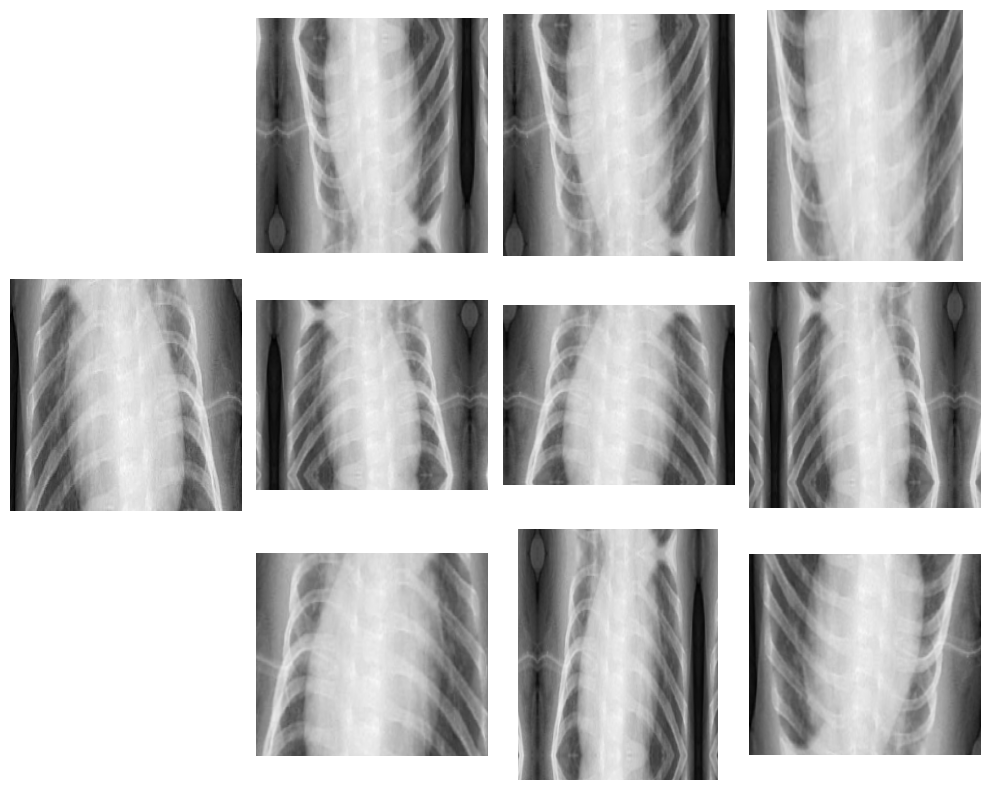

In [42]:
display_augmented_images(xray_train_ds)

# VGG-16


The following model definitions will be used for all 3 datasets.

In [43]:
def build_vgg16_model(num_classes, model_name, activ='softmax'):
    vgg16_base = keras.applications.vgg16.VGG16(
        weights="imagenet",
        include_top=False,
        input_shape=(IMG_SIZE,IMG_SIZE,3)
    )

    vgg16_base.trainable = False

    inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
    x = data_augmentation(inputs)
    x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
    x = keras.applications.vgg16.preprocess_input(x)
 
    x = vgg16_base(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
 
    outputs = layers.Dense(num_classes, activation=activ)(x)

    model = keras.Model(inputs, outputs, name=model_name)

    model.summary()

    return model


In [44]:
def build_vgg16_model_batch_norm(num_classes, model_name, activ='softmax'):
    vgg16_base = keras.applications.vgg16.VGG16(
        weights="imagenet",
        include_top=False,
        input_shape=(IMG_SIZE,IMG_SIZE,3)
    )

    vgg16_base.trainable = False

    inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
    x = data_augmentation(inputs)
    x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
    x = keras.applications.vgg16.preprocess_input(x)
 
    x = vgg16_base(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
 
    outputs = layers.Dense(num_classes, activation=activ)(x)

    model = keras.Model(inputs, outputs, name=model_name)

    model.summary()

    return model

## Brain Tumor

### Baseline

58889256/58889256 [==============================] - 0s 0us/step
Model: "bt_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 resizing (Resizing)         (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         1

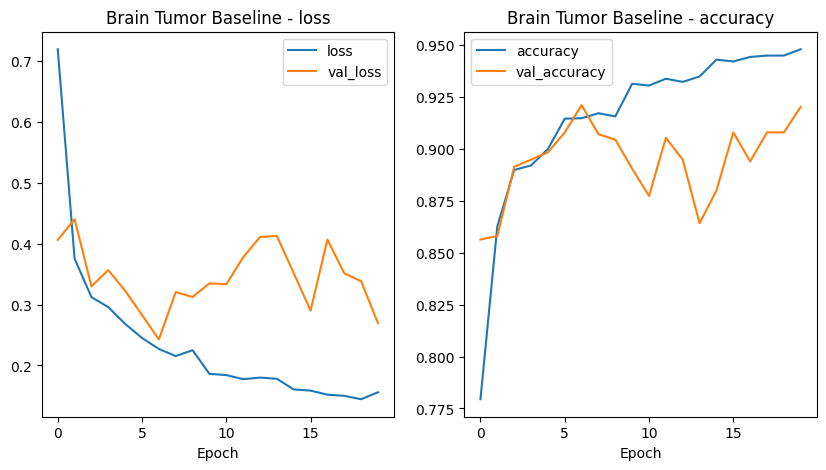

In [45]:
bt_model = build_vgg16_model(len(bt_train_ds.class_names), 'bt_baseline')
bt_cb_name = "bt_vgg16_cb.keras"
train_model(bt_train_ds, bt_valid_ds, bt_model, bt_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Brain Tumor Baseline')


41/41 [==============================] - 10s 234ms/step - loss: 0.2559 - accuracy: 0.8978
[0.2558874189853668, 0.8977879285812378]
41/41 [==============================] - 6s 127ms/step


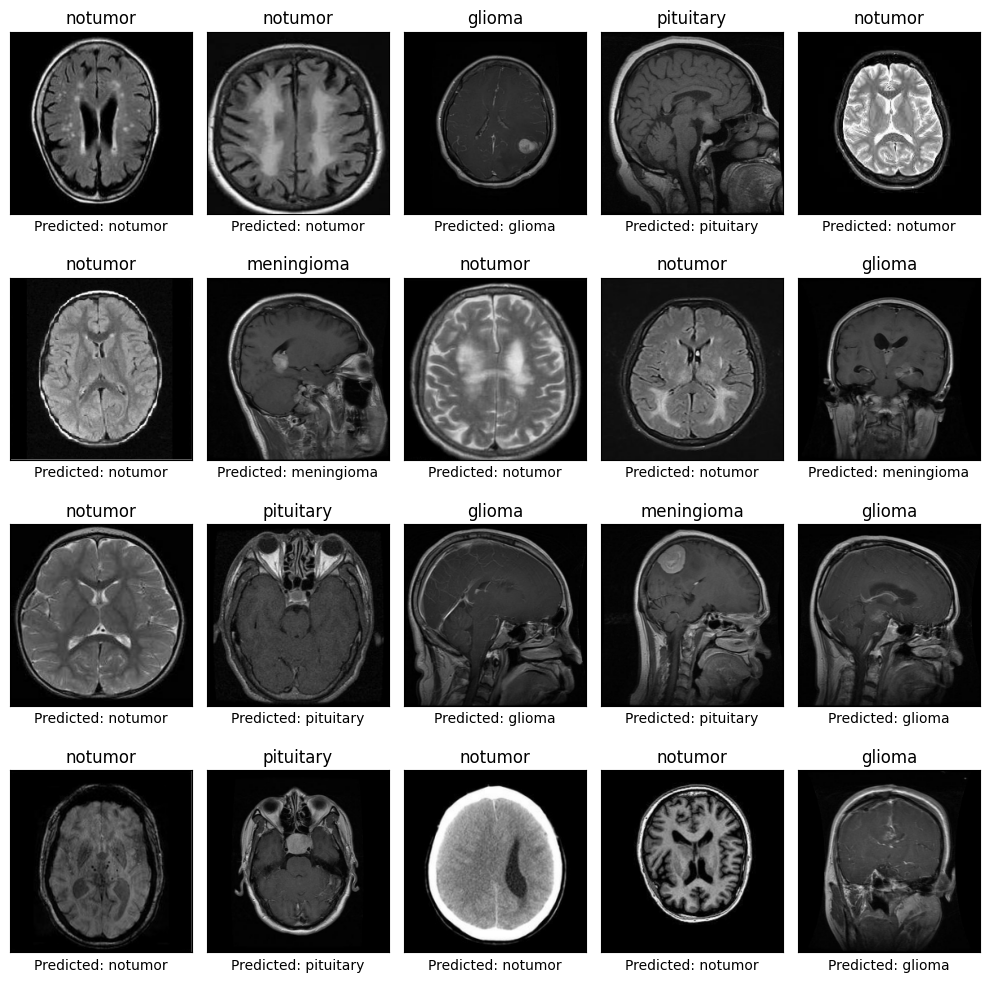

In [46]:
evaluate_model(bt_cb_name, bt_test_ds)

### Trial 1 - batch normalization

Model: "bt_t1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_4 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_4   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_4 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         147146

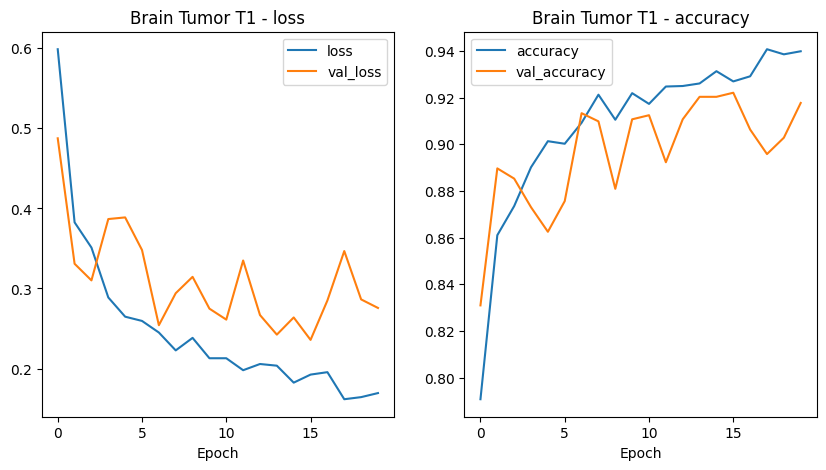

In [ ]:
bt1_model = build_vgg16_model_batch_norm(len(bt_train_ds.class_names), 'bt_t1')
bt1_cb_name = "bt1_vgg16_cb.keras"
train_model(bt_train_ds, bt_valid_ds, bt1_model, bt1_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Brain Tumor T1')

41/41 [==============================] - 7s 137ms/step - loss: 0.2572 - accuracy: 0.9153
[0.25720667839050293, 0.9153317809104919]
41/41 [==============================] - 6s 134ms/step


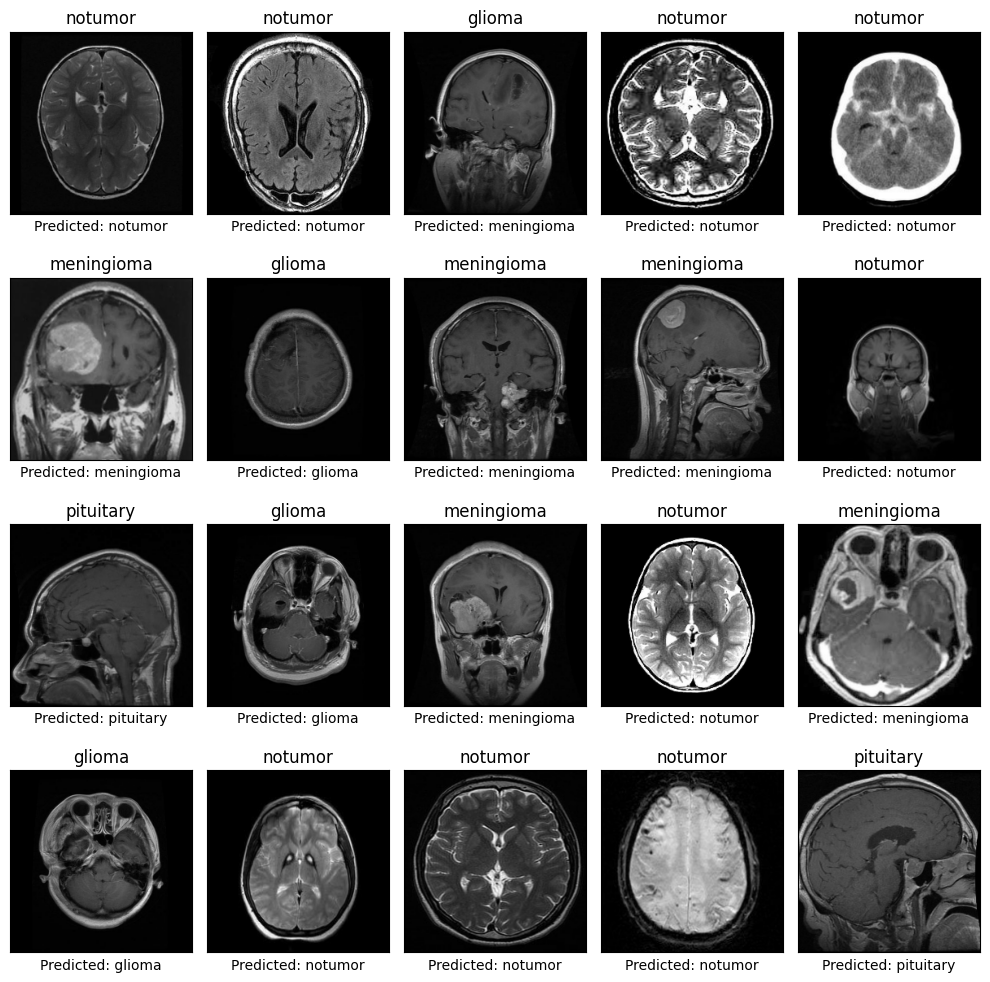

In [ ]:
evaluate_model(bt1_cb_name, bt_test_ds)

### Trial 2 - batch normalization, 50 epochs

Model: "bt_t2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_9 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_9   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_9 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         147146

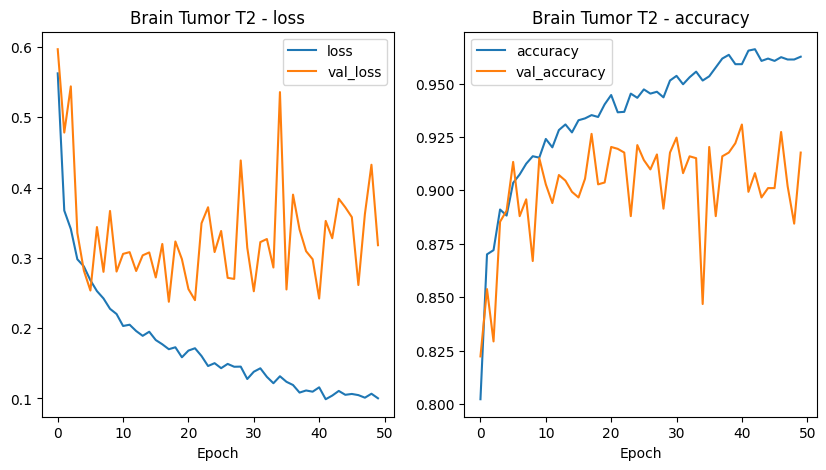

In [ ]:
bt2_model = build_vgg16_model_batch_norm(len(bt_train_ds.class_names), 'bt_t2')
bt2_cb_name = "bt2_vgg16_cb.keras"
train_model(bt_train_ds, bt_valid_ds, bt2_model, bt2_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Brain Tumor T2', 50)

41/41 [==============================] - 6s 132ms/step - loss: 0.2624 - accuracy: 0.9138
[0.2623708248138428, 0.9138062596321106]
41/41 [==============================] - 6s 134ms/step


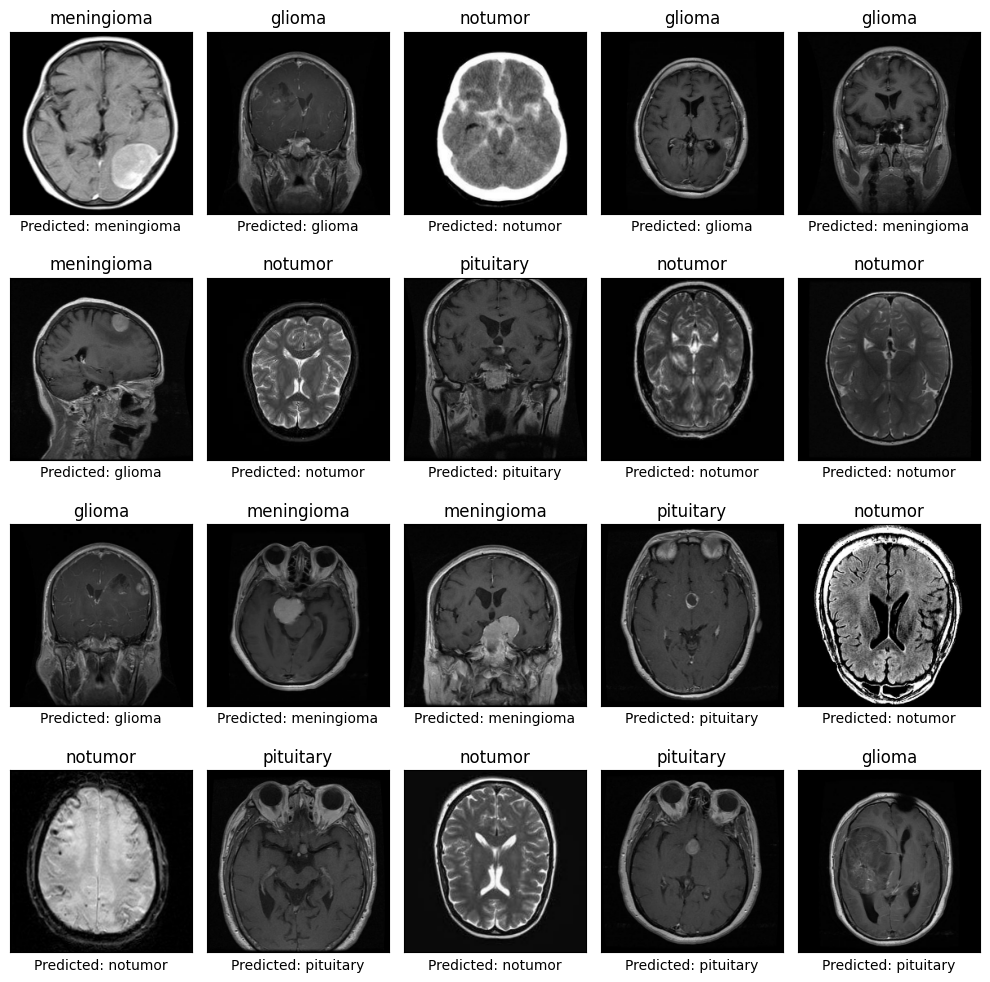

In [ ]:
evaluate_model(bt2_cb_name, bt_test_ds)

## Leukemia

### Baseline

Model: "leu_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_2 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_2   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)        

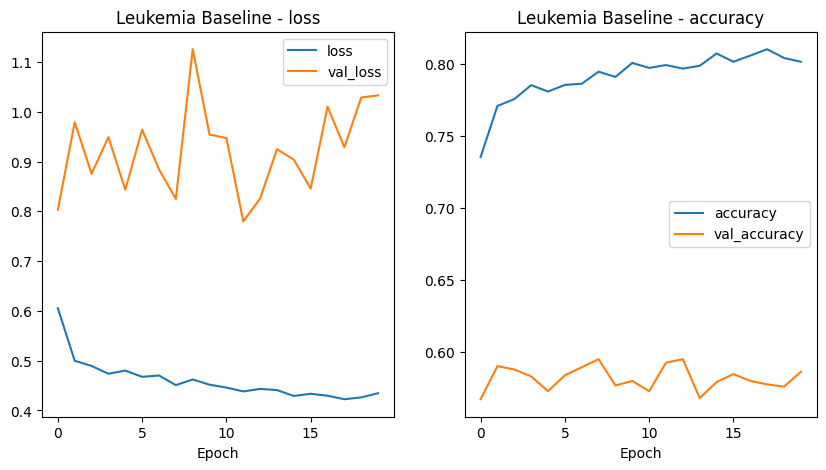

In [ ]:
leu_model = build_vgg16_model(len(leu_train_ds.class_names), 'leu_baseline')
leu_cb_name = "leu_vgg16_cb.keras"
train_model(leu_train_ds, leu_valid_ds, leu_model, leu_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Leukemia Baseline')

40/40 [==============================] - 9s 184ms/step - loss: 0.7992 - accuracy: 0.6920
[0.7991729974746704, 0.6920031905174255]
40/40 [==============================] - 5s 122ms/step


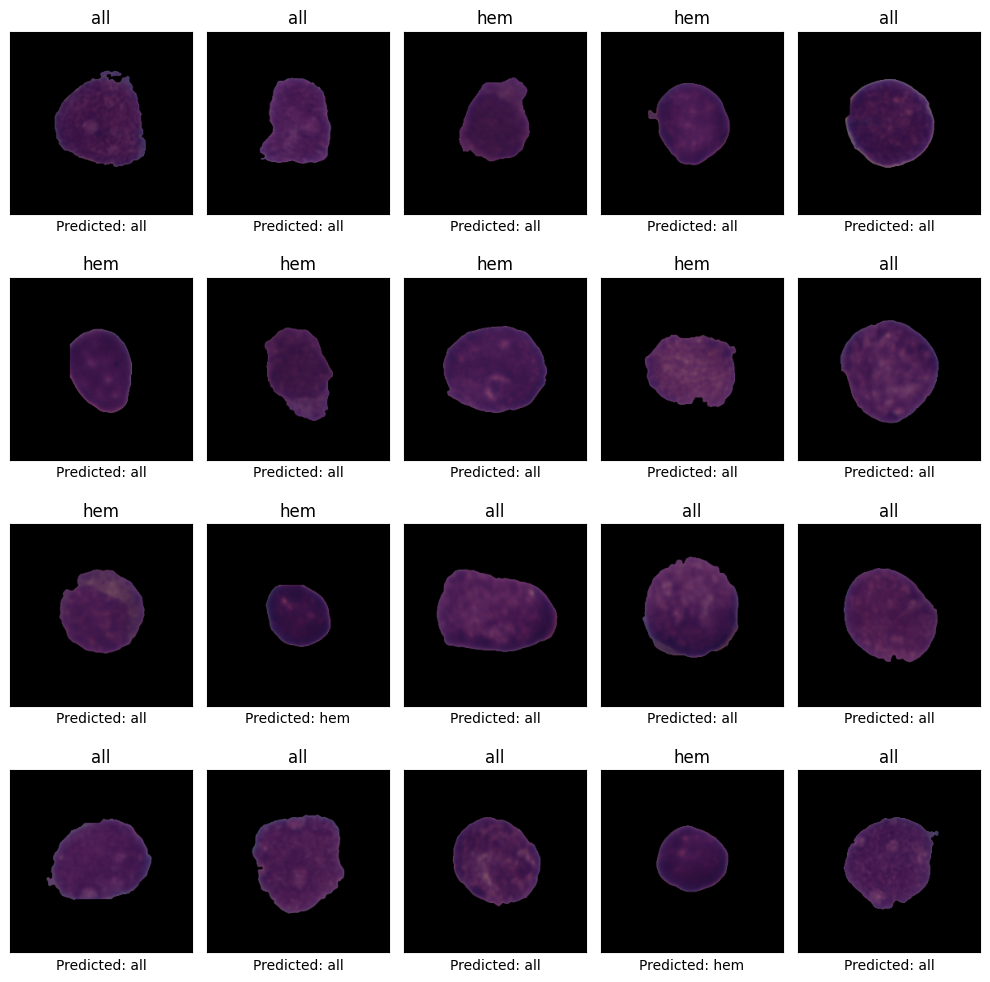

In [ ]:
evaluate_model(leu_cb_name, leu_test_ds)

### Trial 1 - binary_crosseentropy, RMSProp

Model: "leu_t1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 resizing_1 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_1   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714

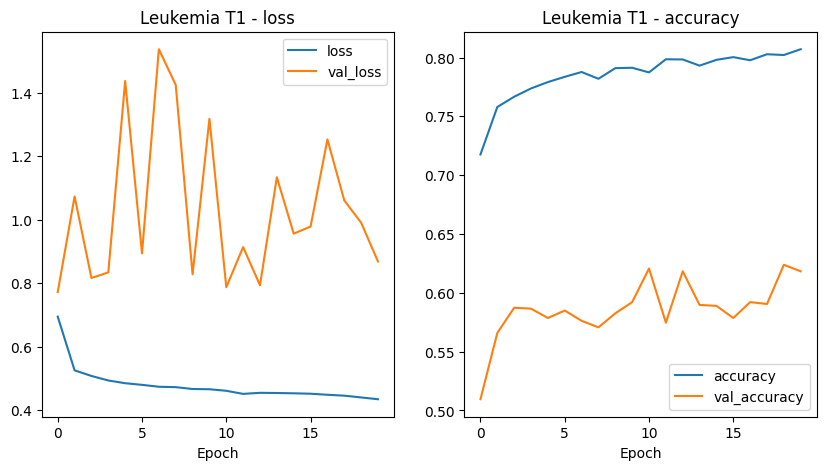

In [47]:
leu1_model = build_vgg16_model(1, 'leu_t1', 'sigmoid')
leu1_cb_name = "leu1_vgg16_cb.keras"
train_model(leu_train_ds, leu_valid_ds, leu1_model, leu1_cb_name, 'RMSProp', 'binary_crossentropy', 'Leukemia T1')

40/40 [==============================] - 9s 190ms/step - loss: 0.5551 - accuracy: 0.7664
[0.5550907850265503, 0.7664291262626648]
40/40 [==============================] - 5s 118ms/step


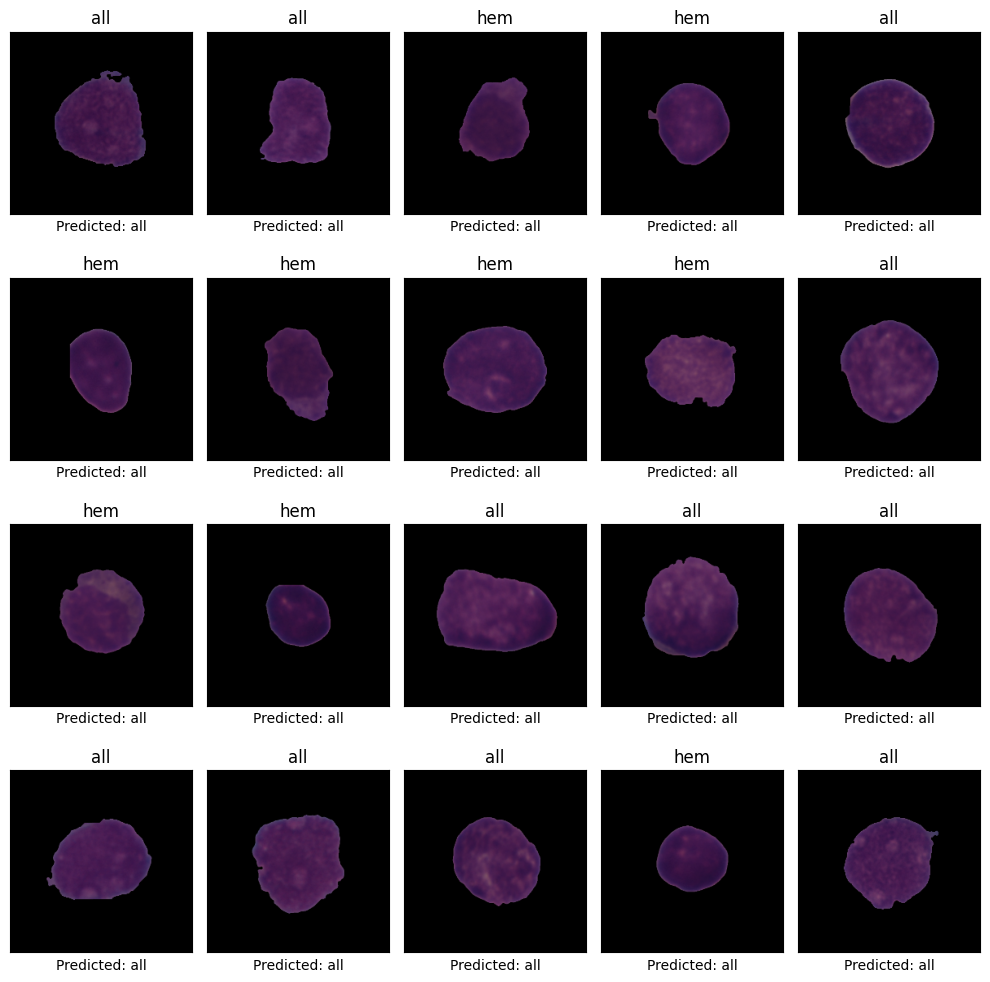

In [48]:
evaluate_model(leu1_cb_name, leu_test_ds)

### Trial 2 - RMSProp

Model: "leu_t2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_8 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_8   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_8 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714

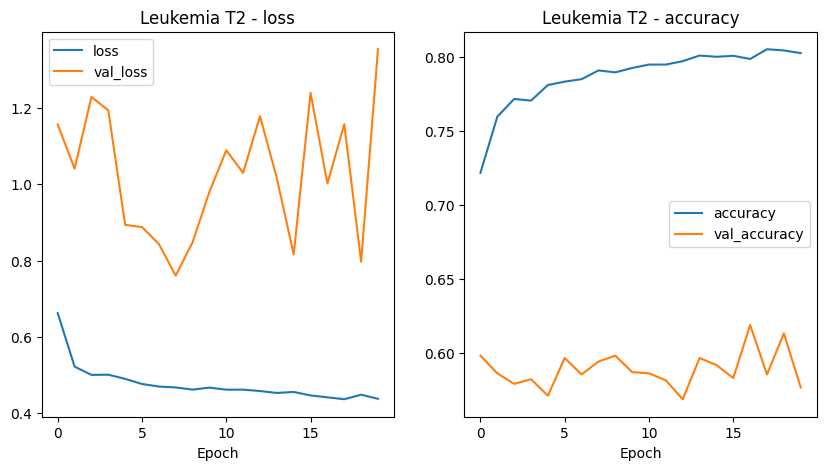

In [ ]:
leu2_model = build_vgg16_model(len(leu_train_ds.class_names), 'leu_t2')
leu2_cb_name = "leu2_vgg16_cb.keras"
train_model(leu_train_ds, leu_valid_ds, leu2_model, leu2_cb_name, 'RMSProp', 'sparse_categorical_crossentropy', 'Leukemia T2')

40/40 [==============================] - 7s 124ms/step - loss: 0.7111 - accuracy: 0.7332
[0.7111180424690247, 0.7331749796867371]
40/40 [==============================] - 5s 122ms/step


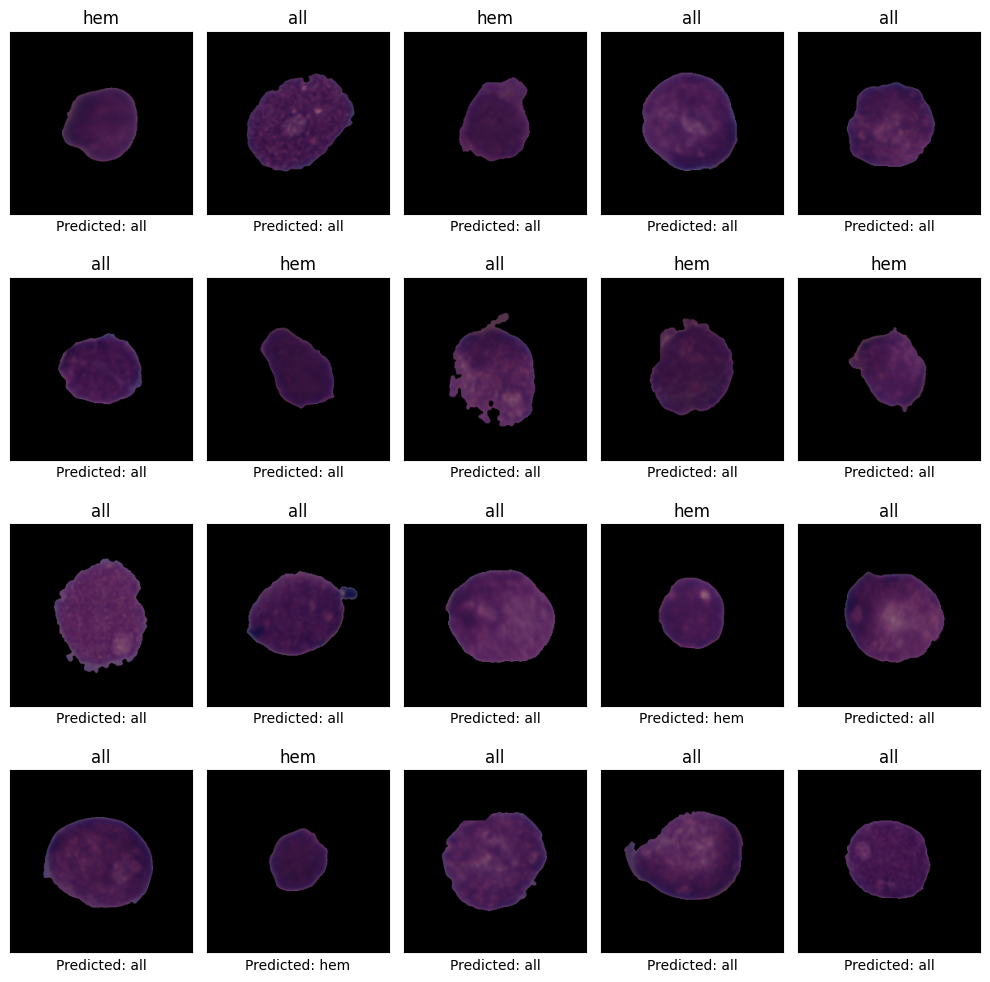

In [ ]:
evaluate_model(leu2_cb_name, leu_test_ds)

### Trial 3 - batch normalization, binary_crossentrop, RMSProp

Model: "leu_t3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_5 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_5   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_5 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714

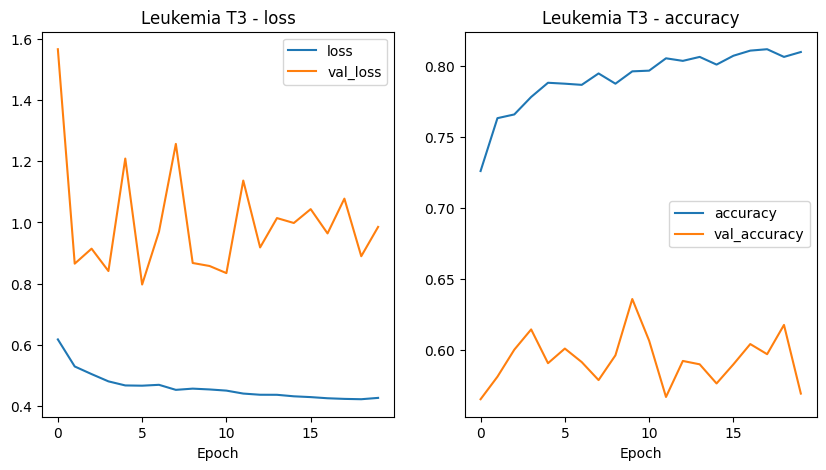

In [ ]:
leu3_model = build_vgg16_model_batch_norm(1, 'leu_t3', 'sigmoid')
leu3_cb_name = "leu3_vgg16_cb.keras"
train_model(leu_train_ds, leu_valid_ds, leu3_model, leu3_cb_name, 'RMSProp', 'binary_crossentropy', 'Leukemia T3')

40/40 [==============================] - 7s 127ms/step - loss: 0.8487 - accuracy: 0.6374
[0.8487160205841064, 0.6373713612556458]
40/40 [==============================] - 5s 122ms/step


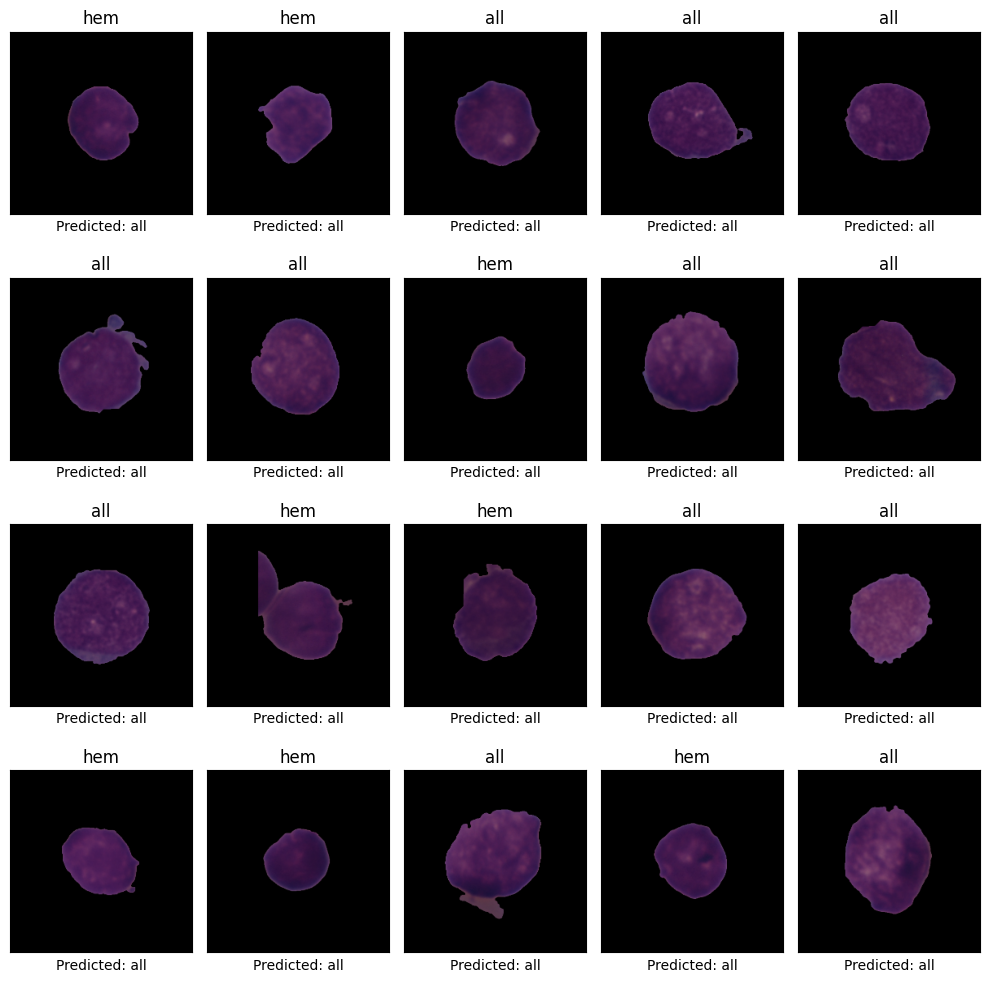

In [ ]:
evaluate_model(leu3_cb_name, leu_test_ds)

### Trial 4 - batch normalization, binary, 50 epochs

Model: "leu_t4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 resizing_7 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_7   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_7 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714

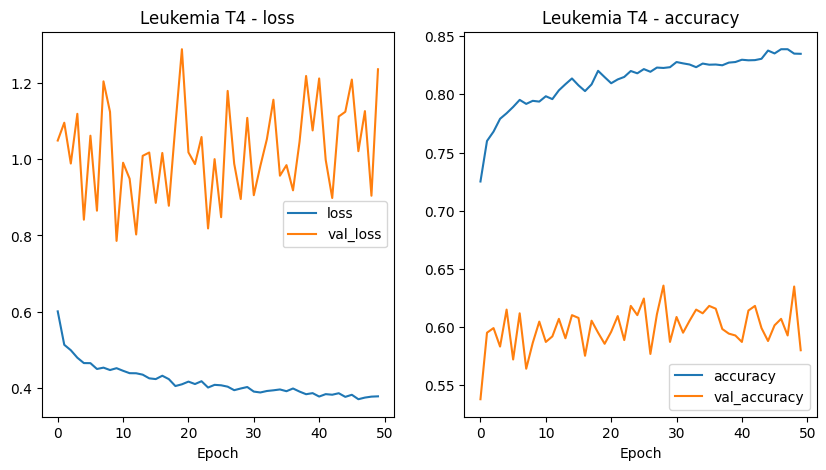

In [ ]:
leu4_model = build_vgg16_model_batch_norm(1, 'leu_t4', 'sigmoid')
leu4_cb_name = "leu4_vgg16_cb.keras"
train_model(leu_train_ds, leu_valid_ds, leu4_model, leu4_cb_name, 'RMSProp', 'binary_crossentropy', 'Leukemia T4', 50)

40/40 [==============================] - 6s 124ms/step - loss: 0.9771 - accuracy: 0.5835
[0.9770585894584656, 0.5835312604904175]
40/40 [==============================] - 5s 121ms/step


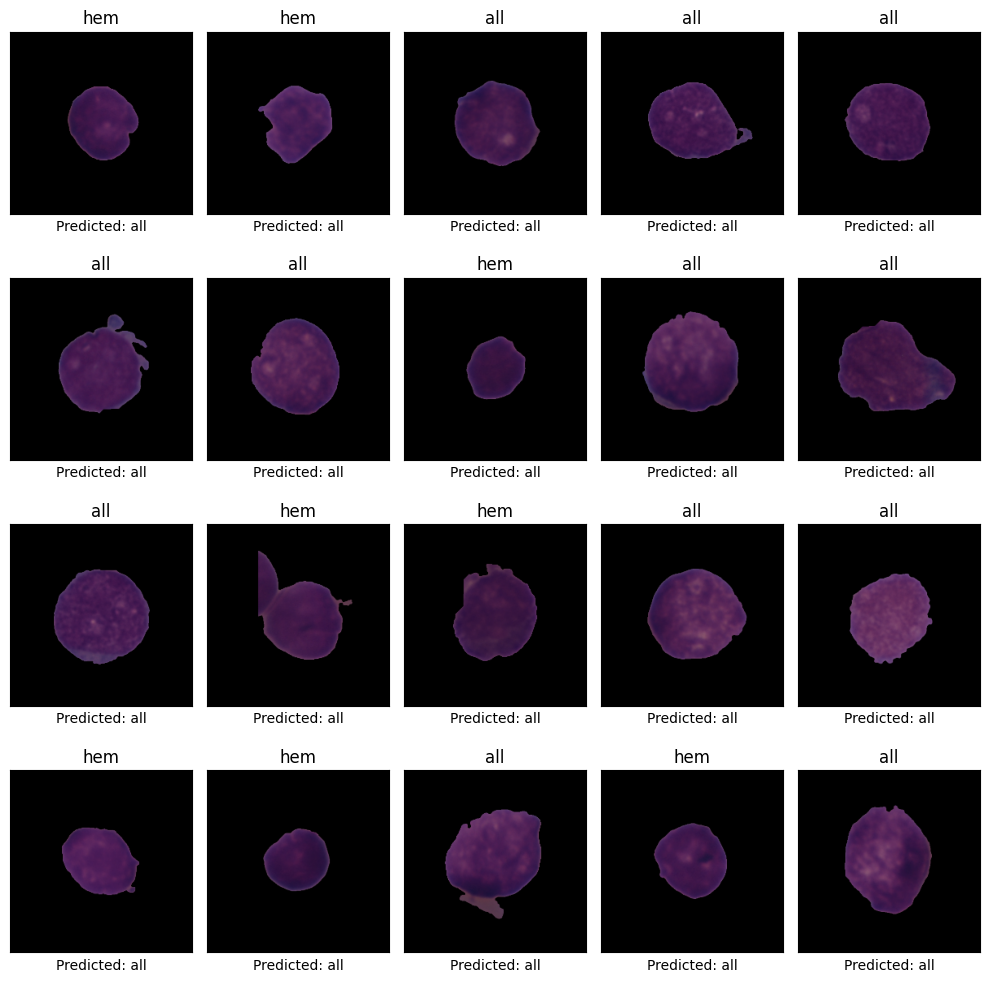

In [ ]:
evaluate_model(leu4_cb_name, leu_test_ds)

## Chest X-Ray

### Baseline

Model: "xray_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_3 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_3   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_3 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)       

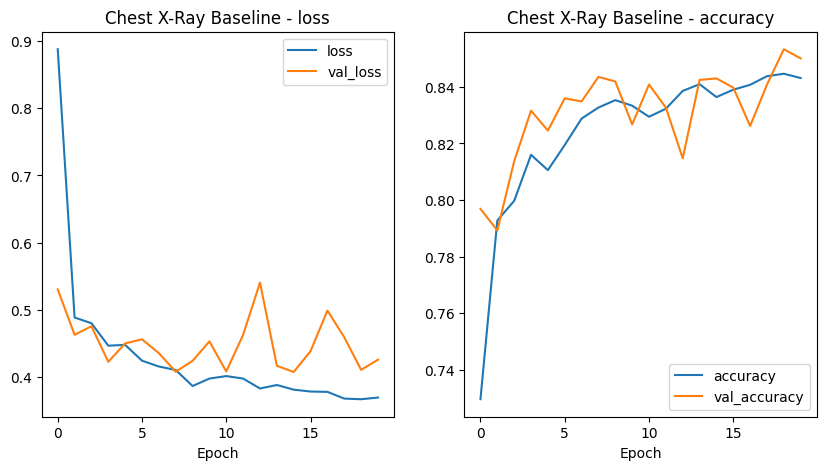

In [ ]:
xray_model = build_vgg16_model(len(xray_train_ds.class_names), 'xray_baseline')
xray_cb_name = "xray_vgg16_cb.keras"
train_model(xray_train_ds, xray_valid_ds, xray_model, xray_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Chest X-Ray Baseline')

87/87 [==============================] - 33s 343ms/step - loss: 0.3906 - accuracy: 0.8419
[0.3906051218509674, 0.8418958187103271]
87/87 [==============================] - 30s 312ms/step


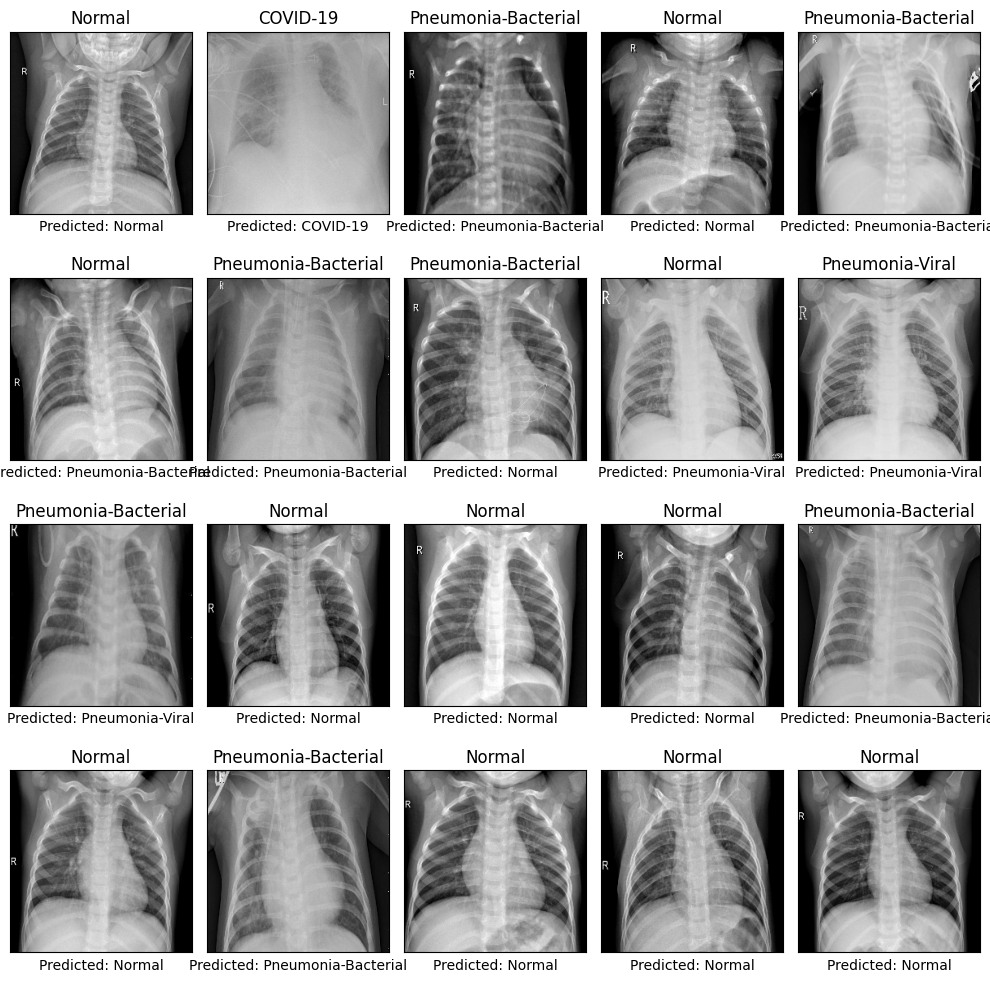

In [ ]:
evaluate_model(xray_cb_name, xray_test_ds)

### Trial 1 - batch normalization

Model: "xray_t1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resizing_6 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_6   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_6 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         1471

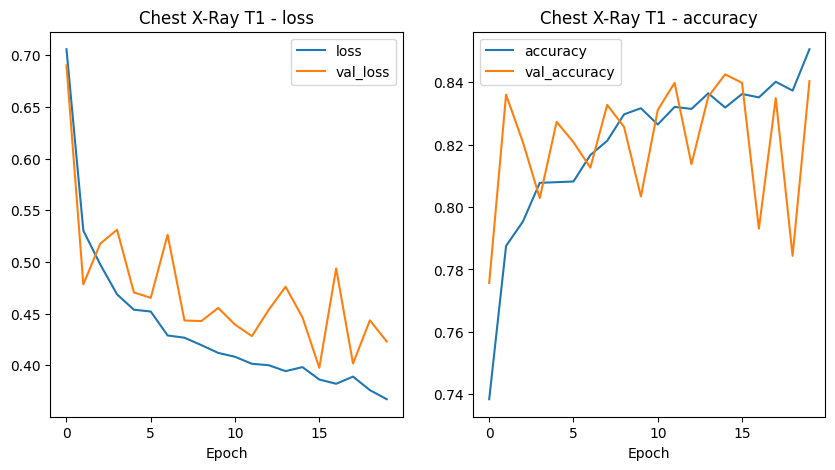

In [ ]:
xray1_model = build_vgg16_model_batch_norm(len(xray_train_ds.class_names), 'xray_t1')
xray1_cb_name = "xray1_vgg16_cb.keras"
train_model(xray_train_ds, xray_valid_ds, xray1_model, xray1_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Chest X-Ray T1')

87/87 [==============================] - 34s 350ms/step - loss: 0.4021 - accuracy: 0.8357
[0.4021240770816803, 0.8357452750205994]
87/87 [==============================] - 30s 316ms/step


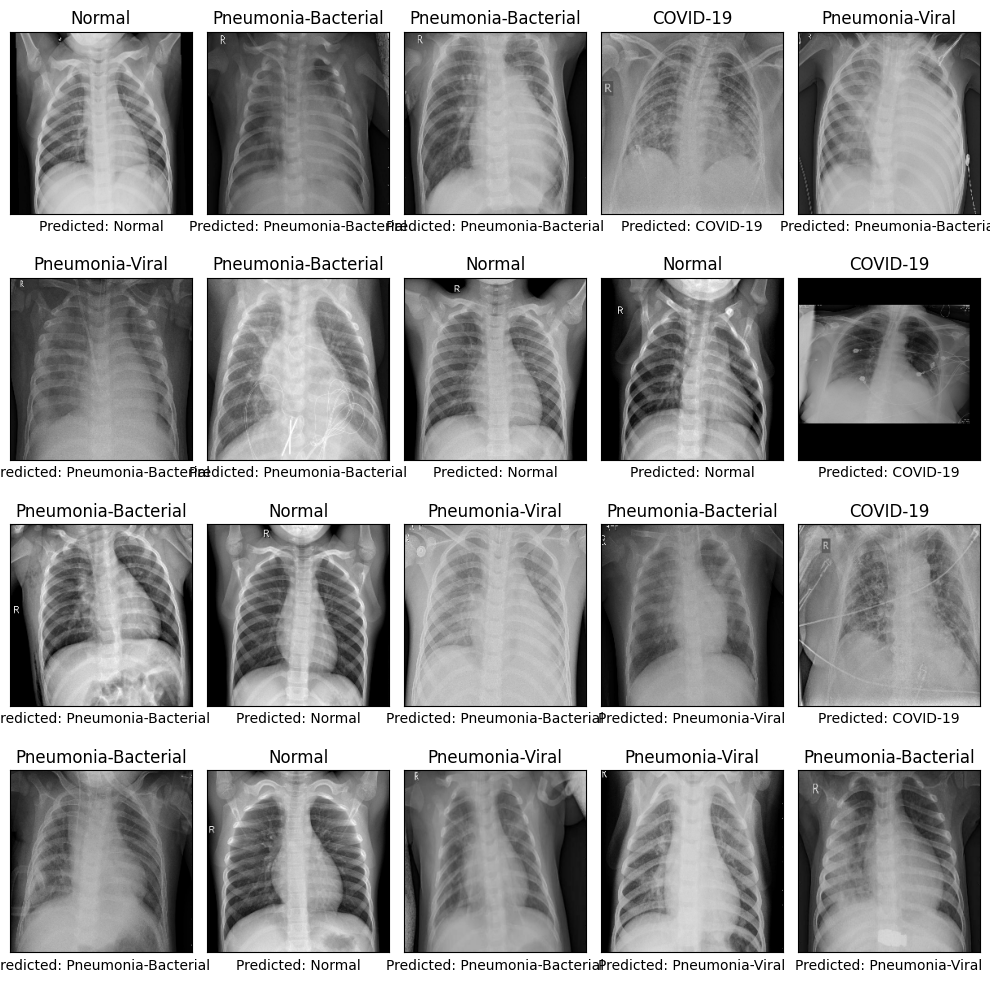

In [ ]:
evaluate_model(xray1_cb_name, xray_test_ds)

### Trial 2 - batch normalization, 50 epochs

Model: "xray_t2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 resizing_2 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_2   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         1471

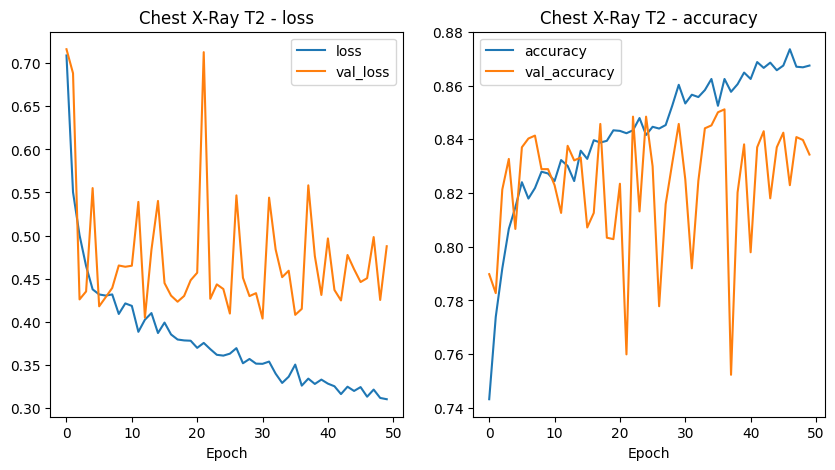

In [49]:
xray2_model = build_vgg16_model_batch_norm(len(xray_train_ds.class_names), 'xray_t2')
xray2_cb_name = "xray2_vgg16_cb.keras"
train_model(xray_train_ds, xray_valid_ds, xray2_model, xray2_cb_name, 'Adam', 'sparse_categorical_crossentropy', 'Chest X-Ray T2', 50)

87/87 [==============================] - 32s 319ms/step - loss: 0.3949 - accuracy: 0.8253
[0.39489802718162537, 0.8252532482147217]
87/87 [==============================] - 28s 301ms/step


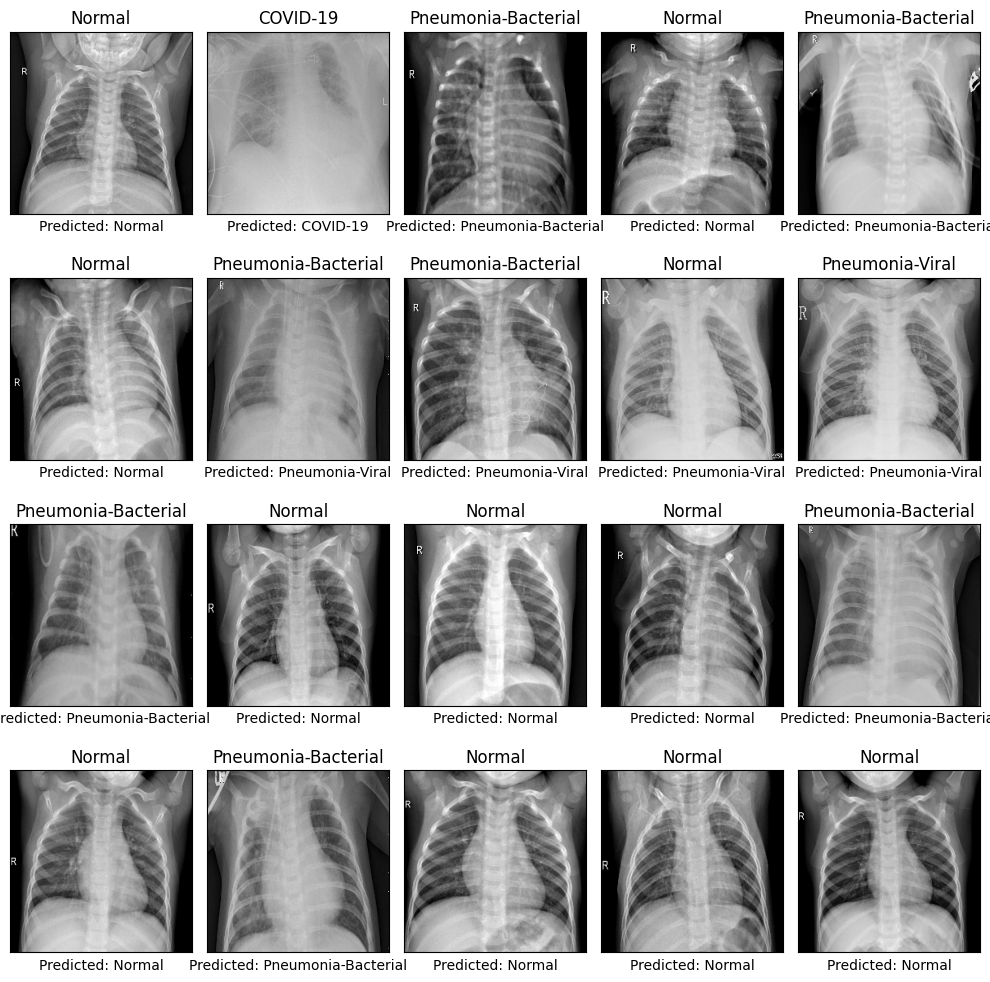

In [50]:
evaluate_model(xray2_cb_name, xray_test_ds)